In [1]:
import matplotlib.pyplot as plt
from scipy import stats
import pickle
import os, sys
sys.path.append(os.path.join(os.getcwd(), '..')) # this is the ml_dadi dir
import data_manip, ml_models, plotting
from plotting import plot_by_param_4x4, plot_by_param_2x2

In [68]:
# Load files for RFR with no log transform & full range
# load testing data set
list_test_dict = pickle.load(open('data/test_data_full','rb'))
# load list of trained rfr
list_rfr = pickle.load(open('data/list_rfr_full','rb'))

In [69]:
# Load files for RFR with no log transform & T/nu > 5 exclusion
# load testing data set
list_test_dict = pickle.load(open('data/test_data_exclude','rb'))
# load list of trained rfr
list_rfr = pickle.load(open('data/list_rfr_exclude','rb'))

In [9]:
# Load files for RFR with log transform & full range
# load testing data set
list_test_dict = pickle.load(open('data/test_data_full','rb'))
# load list of trained rfr
list_rfr = pickle.load(open('data/list_rfr_full_log','rb'))

In [2]:
# Load files for RFR with log transform & T/nu > 5 exclusion
# load testing data set
list_test_dict = pickle.load(open('data/test_data_exclude','rb'))
# load list of trained rfr
list_rfr = pickle.load(open('data/list_rfr_exclude_log','rb'))

In [2]:
# Load files for MLPR with adam solver & T/nu > 5 exclusion
# load testing data set
list_test_dict = pickle.load(open('data/test_data_exclude','rb'))
# load list of trained mlpr
list_mlpr = pickle.load(open('data/list_mlpr_exclude_log_adam','rb'))

In [ ]:
# Load files for MLPR with adam solver & full range

In [4]:
# Load files for MLPR with lbfgs solver & T/nu > 5 exclusion
# load testing data set
list_test_dict = pickle.load(open('data/test_data_exclude','rb'))
# load list of trained mlpr
list_mlpr = pickle.load(open('data/list_mlpr_exclude_log_lbfgs','rb'))

In [ ]:
# Load files for MLPR with lbfgs solver & full range

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

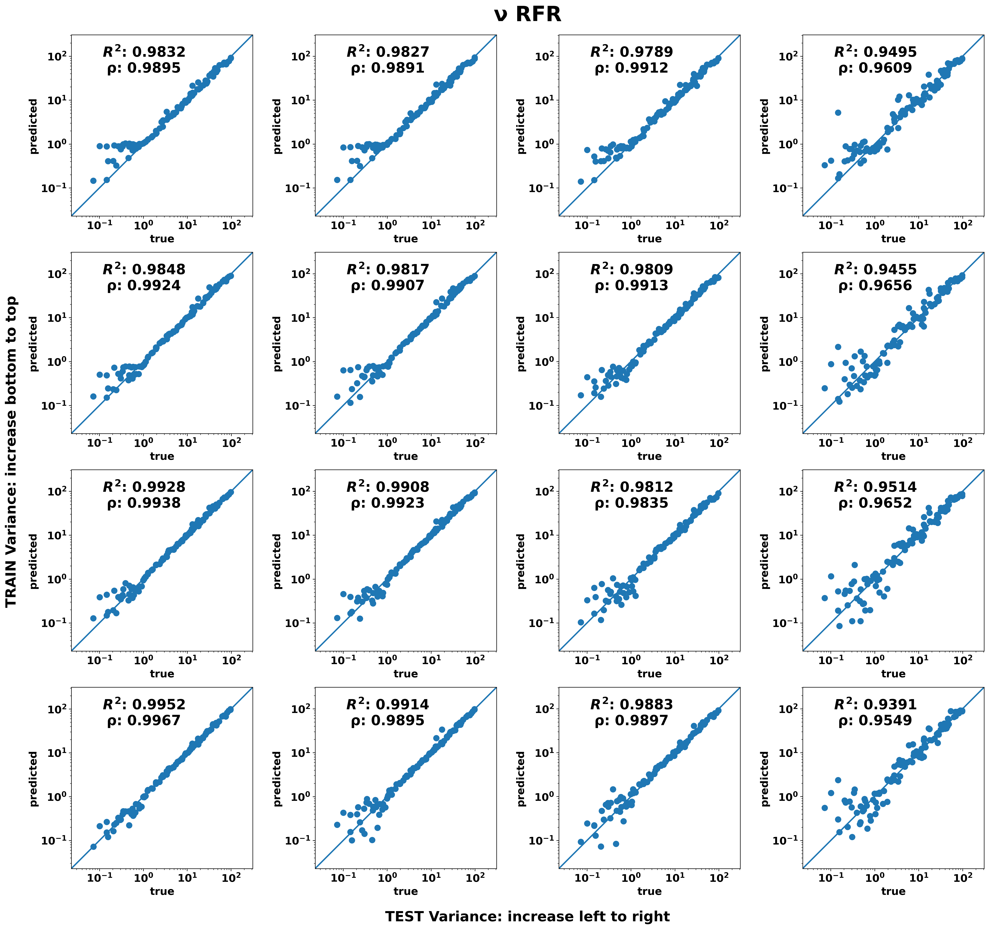

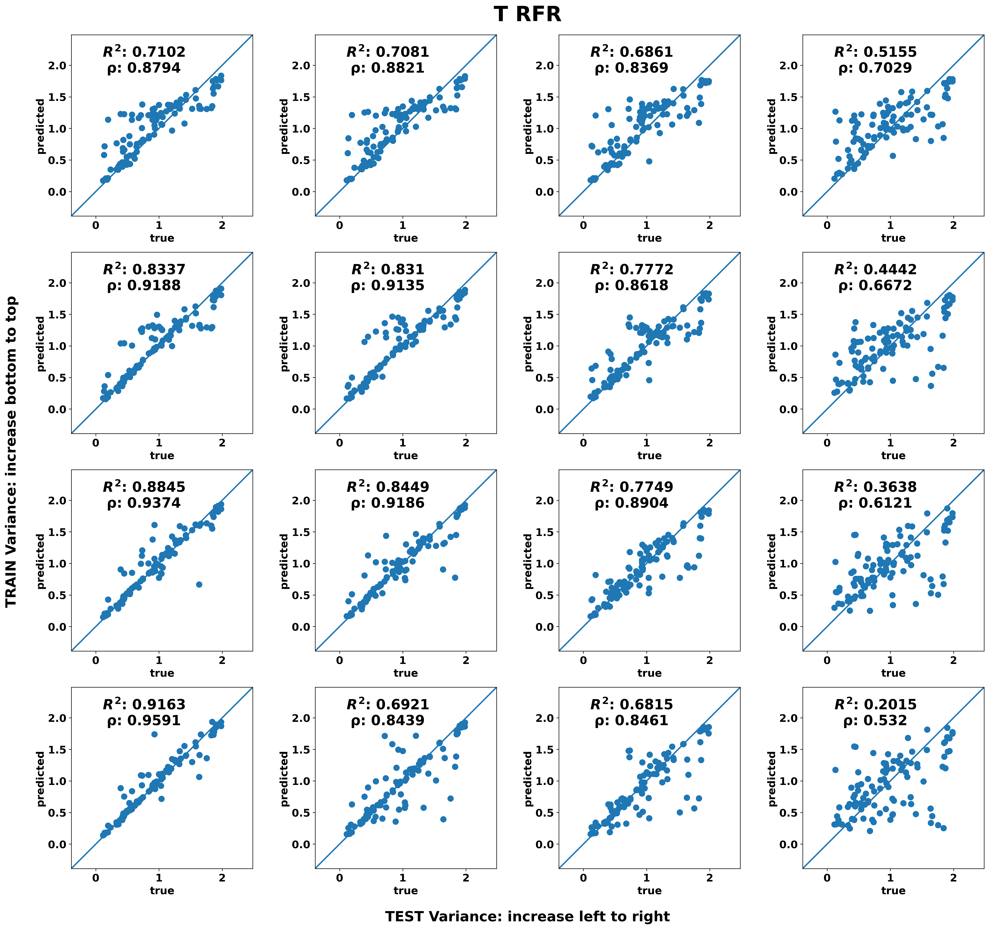

In [3]:
# RFR 4x4 training & testing var, no color
# Create two figures one for nu and one for T
fig1=plt.figure(1, figsize=(24,22), dpi=300)
plt.gca().set_title("ν RFR", fontsize=30 , fontweight='bold', pad=20)

fig2=plt.figure(2, figsize=(24,22), dpi=300)
plt.gca().set_title("T RFR", fontsize=30 , fontweight='bold', pad=20)

for i in [1,2]:
    plt.figure(i)
    ax = plt.gca()
    ax.set_xlabel("TEST Variance: increase left to right", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    ax.set_ylabel("TRAIN Variance: increase bottom to top", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    for key, spine in ax.spines.items():
        spine.set_visible(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.rcParams.update({'font.size': 15})
    plt.rcParams.update({'font.weight': 'bold'})

# testing, and plotting
count_pos = 1
for rfr in reversed(list_rfr):# flip the order of trained rfr for plotting
    for test_dict in list_test_dict:
        y_true, y_predict = ml_models.rfr_test(rfr, test_dict)
        # if use log transformed data
        new_y_predict = data_manip.un_log_transform_predict(y_predict, [0])
        # if use normal data
        # new_y_predict = y_predict
        # sort results of ML prediction by param                               
        param_true, param_pred = data_manip.sort_by_param(y_true, new_y_predict)
        # calculate r2 and msle scores
        r2_by_param = ml_models.r2(y_true, new_y_predict)[1]
        # msle_by_param = ml_models.msle(y_true, new_y_predict)[1]
        # using Spearman rho instead of Pearson's coefficient
        rho_by_param = stats.spearmanr(y_true, new_y_predict)
        
        # PLOT MULTIPLE SUBPLOT VERSION
        plt.figure(1)
        fig1.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[0], param_pred[0], 
                r2_by_param[0],rho=rho_by_param[0][0][2])#, msle_by_param[0])

        plt.figure(2)
        fig2.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[1], param_pred[1], 
                r2_by_param[1], rho=rho_by_param[0][1][3])#,msle_by_param[0])
        count_pos += 1

# fig1.savefig('results/RFR/nu_exclude_log.png', bbox_inches='tight')
# fig2.savefig('results/RFR/T_exclude_log.png', bbox_inches='tight')

# fig1.savefig('results/RFR/nu_full_log.png', bbox_inches='tight')
# fig2.savefig('results/RFR/T_full_log.png', bbox_inches='tight')

fig1.show()
fig2.show()

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

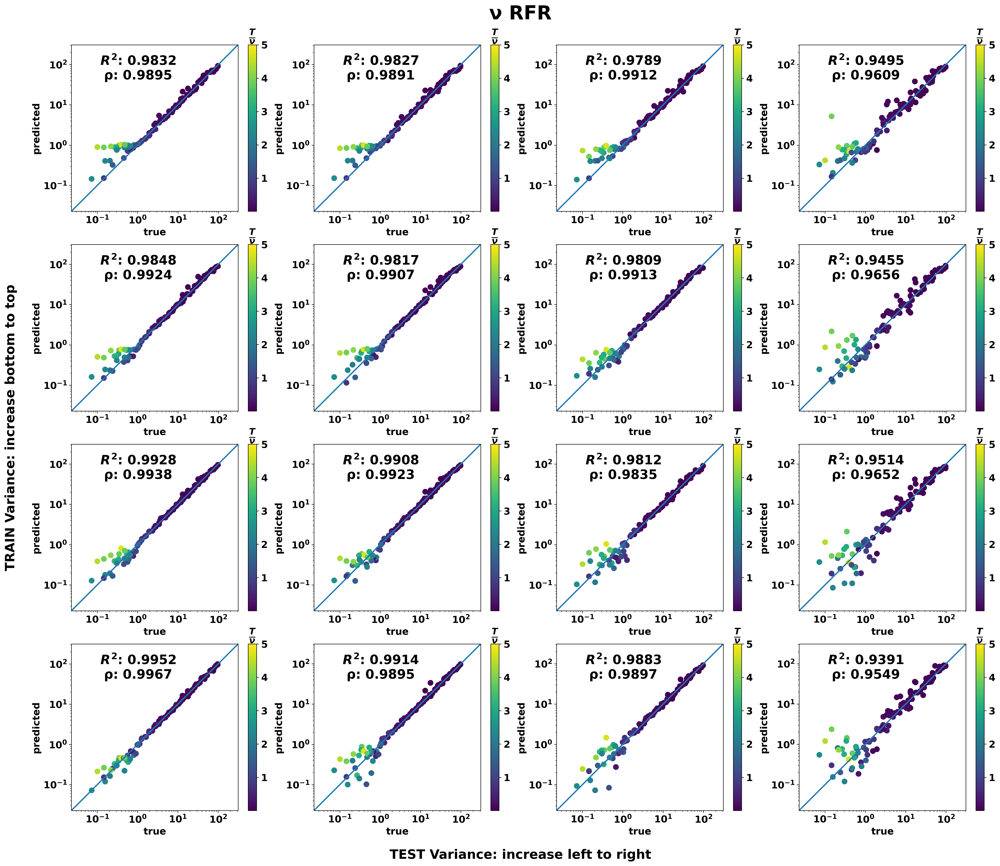

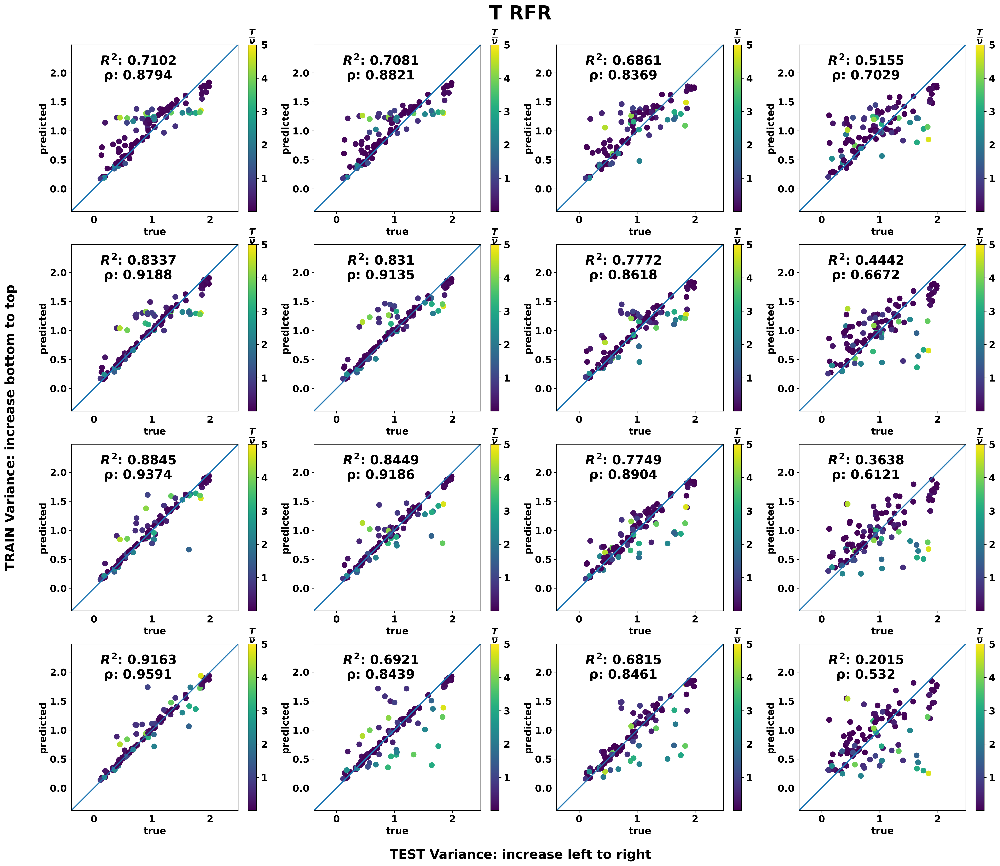

In [12]:
# RFR 4x4 training & testing var, with colorbar
# Create two figures one for nu and one for T
fig1=plt.figure(1, figsize=(26,22), dpi=300)
plt.gca().set_title("ν RFR", fontsize=30 , fontweight='bold', pad=40)

fig2=plt.figure(2, figsize=(26,22), dpi=300)
plt.gca().set_title("T RFR", fontsize=30 , fontweight='bold', pad=40)

for i in [1,2]:
    plt.figure(i)
    ax = plt.gca()
    ax.set_xlabel("TEST Variance: increase left to right", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    ax.set_ylabel("TRAIN Variance: increase bottom to top", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    for key, spine in ax.spines.items():
        spine.set_visible(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.rcParams.update({'font.size': 15})
    plt.rcParams.update({'font.weight': 'bold'})

# testing, and plotting
count_pos = 1
for rfr in reversed(list_rfr): # flip the order of trained rfr for plotting
    for test_dict in list_test_dict:
        y_true, y_predict = ml_models.rfr_test(rfr, test_dict)
        # if use log transformed data
        new_y_predict = data_manip.un_log_transform_predict(y_predict, [0])
        # if use normal data
        # new_y_predict = y_predict
        # sort results of ML prediction by param                               
        param_true, param_pred = data_manip.sort_by_param(y_true, new_y_predict)
        # make list of T/nu based on param_true values
        T_over_nu = [T/nu for T, nu in zip(param_true[1], param_true[0])]
        # calculate r2 and msle scores
        r2_by_param = ml_models.r2(y_true, new_y_predict)[1]
        # using Spearman rho instead of Pearson's coefficient
        rho_by_param = stats.spearmanr(y_true, new_y_predict)
        
        # PLOT MULTIPLE SUBPLOT VERSION
        plt.figure(1)
        fig1.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[0], param_pred[0], 
                    r2_by_param[0], rho=rho_by_param[0][0][2], c=T_over_nu)

        plt.figure(2)
        fig2.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[1], param_pred[1], 
                        r2_by_param[1], rho=rho_by_param[0][1][3], c=T_over_nu)
        count_pos += 1

# fig1.savefig('results/RFR/nu_exclude_log_color.png', bbox_inches='tight')
# fig2.savefig('results/RFR/T_exclude_log_color.png', bbox_inches='tight')

# fig1.savefig('results/RFR/nu_full_log_color.png', bbox_inches='tight')
# fig2.savefig('results/RFR/T_full_log_color.png', bbox_inches='tight')

fig1.show()
fig2.show()

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

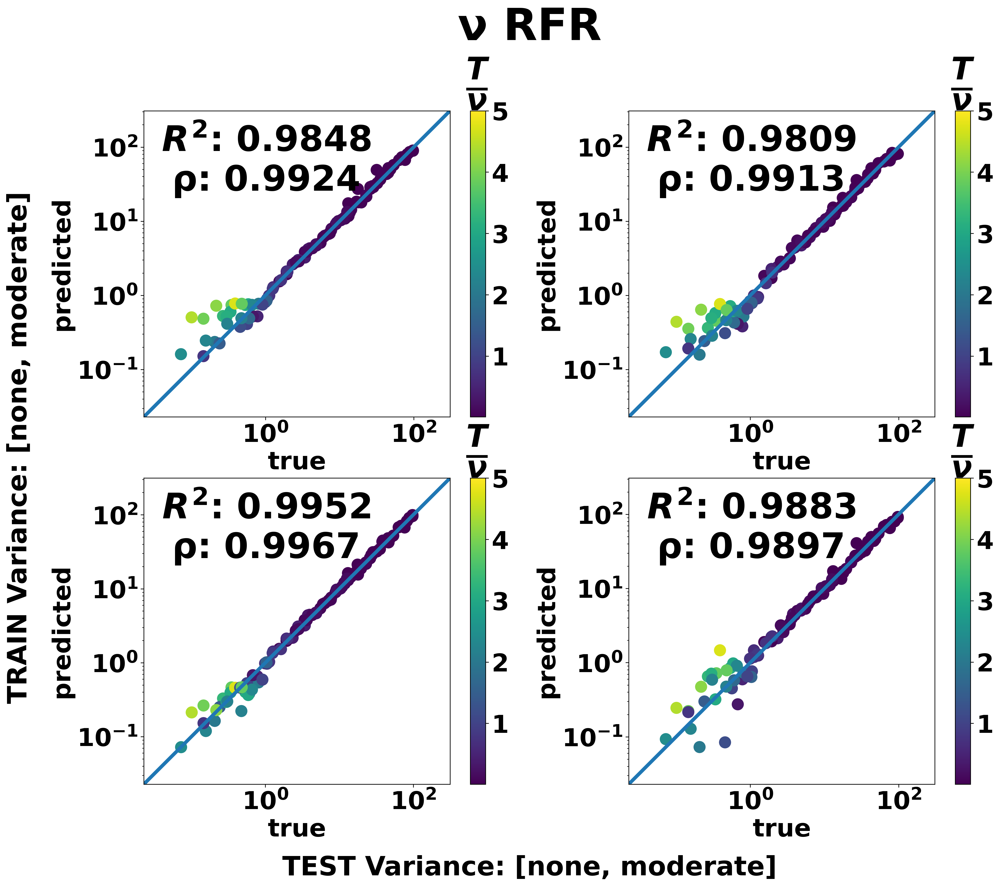

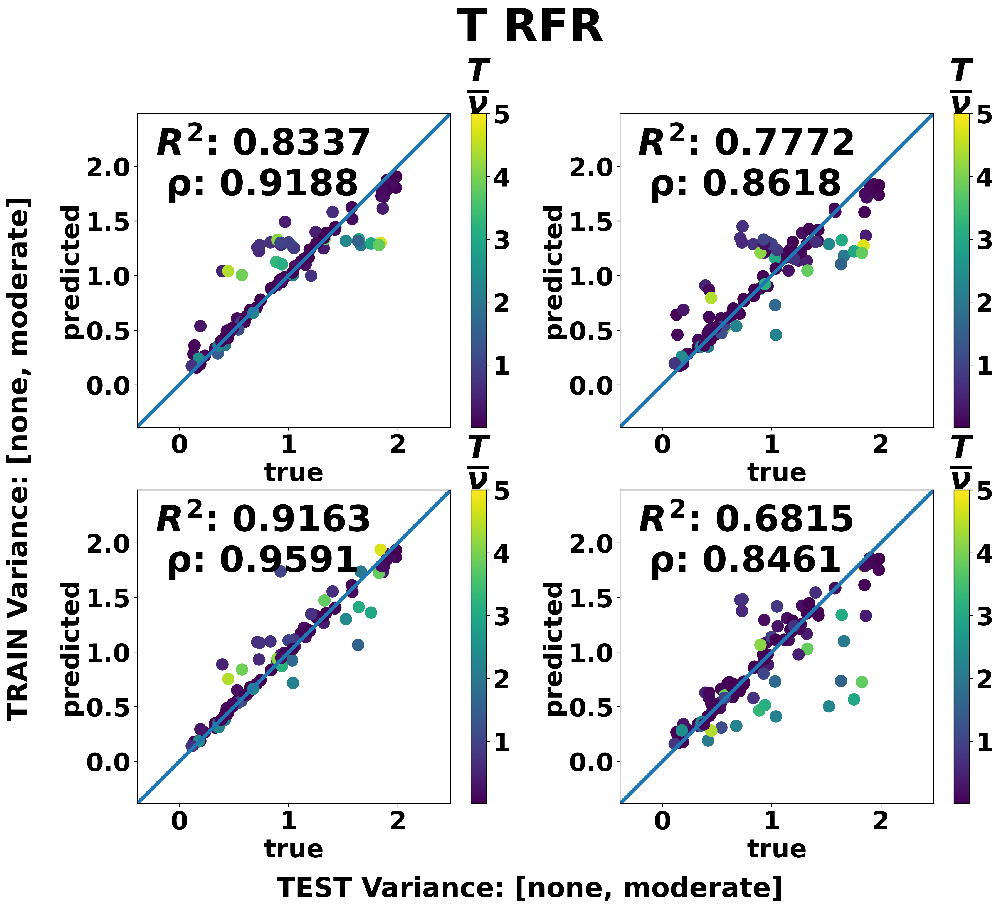

In [13]:
# RFR 2x2 training & testing var, with colorbar
list_test_dict_clipped = [list_test_dict[0], list_test_dict[2]]
list_rfr_clipped = [list_rfr[2], list_rfr[0]]

# Create two figures one for nu and one for T
fig1=plt.figure(1, figsize=(18,14), dpi=300)
plt.gca().set_title("ν RFR", fontsize=50 , fontweight='bold', pad=80)

fig2=plt.figure(2, figsize=(17.5,14), dpi=300)
plt.gca().set_title("T RFR", fontsize=50 , fontweight='bold', pad=80)

for i in [1,2]:
    plt.figure(i)
    ax = plt.gca()
    ax.set_xlabel("TEST Variance: [none, moderate]", 
                    fontsize=30 , fontweight='bold', labelpad=80)
    ax.set_ylabel("TRAIN Variance: [none, moderate]", 
                    fontsize=30 , fontweight='bold', labelpad=60)
    for key, spine in ax.spines.items():
        spine.set_visible(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.rcParams.update({'font.size': 28})
    plt.rcParams.update({'font.weight': 'bold'})

count_pos = 1
for rfr in list_rfr_clipped: #do not flip order since _clipped is alr in reverse
    for test_dict in list_test_dict_clipped:
        y_true, y_predict = ml_models.rfr_test(rfr, test_dict)
        # if use log transformed data
        new_y_predict = data_manip.un_log_transform_predict(y_predict, [0])
        # sort results by param                               
        param_true, param_pred = data_manip.sort_by_param(y_true, new_y_predict)
        # make list of T/nu based on param_true values
        T_over_nu = [T/nu for T, nu in zip(param_true[1], param_true[0])]
        # calculate r2 and msle scores
        r2_by_param = ml_models.r2(y_true, new_y_predict)[1]
        rho_by_param = stats.spearmanr(y_true, new_y_predict)
        
        # PLOT MULTIPLE SUBPLOT VERSION
        plt.figure(1)
        fig1.add_subplot(2, 2, count_pos)
        plot_by_param_2x2(param_true[0], param_pred[0], r2_by_param[0], 
                        rho=rho_by_param[0][0][2], c=T_over_nu)

        plt.figure(2)
        fig2.add_subplot(2, 2, count_pos)
        plot_by_param_2x2(param_true[1], param_pred[1], r2_by_param[1], 
                        rho=rho_by_param[0][1][3], c=T_over_nu)
        count_pos += 1

# fig1.savefig('results/RFR/nu_full_log_color_2x2.png', bbox_inches='tight')
# fig2.savefig('results/RFR/T_full_log_color_2x2.png', bbox_inches='tight')

# fig1.savefig('results/RFR/nu_exclude_log_color_2x2.png', bbox_inches='tight')
# fig2.savefig('results/RFR/T_exclude_log_color_2x2.png', bbox_inches='tight')

fig1.show()
fig2.show()

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

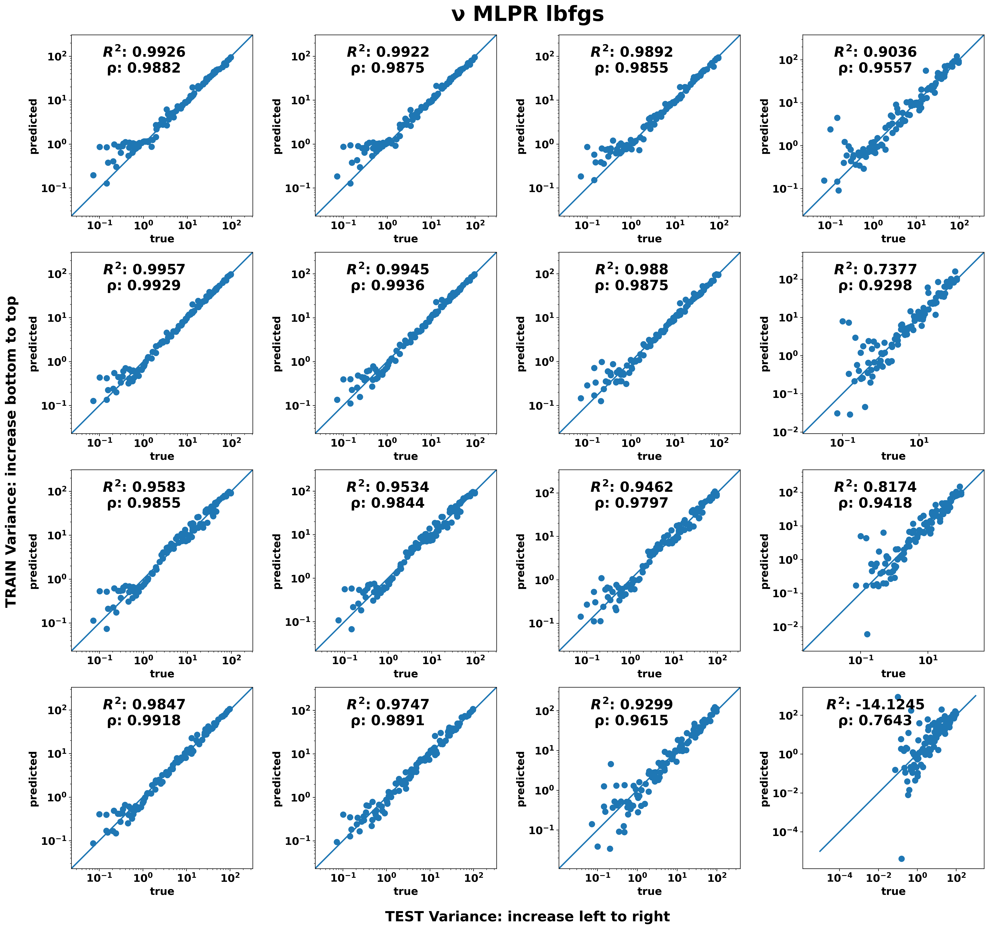

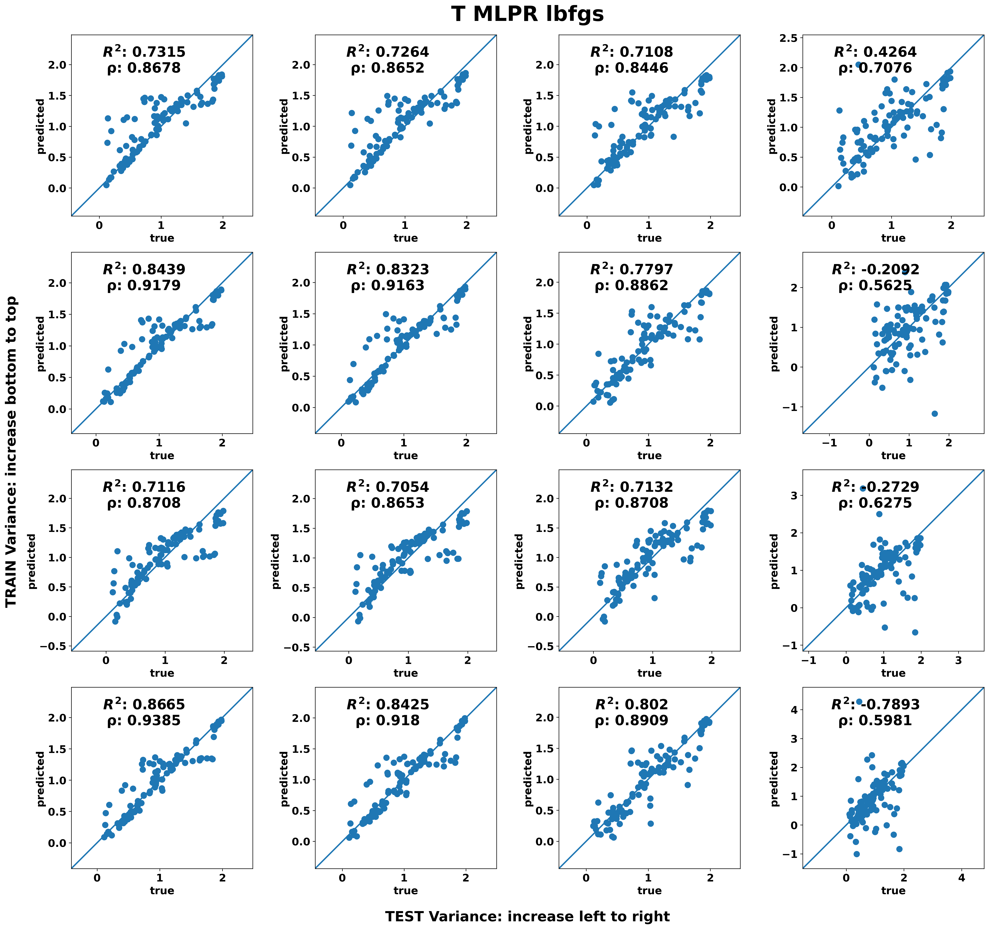

In [5]:
# MLPR 4x4 training & testing var, no color
# Create two figures one for nu and one for T
fig1=plt.figure(1, figsize=(24,22), dpi=300)
# plt.gca().set_title("ν MLPR adam", fontsize=30 , fontweight='bold', pad=20)
plt.gca().set_title("ν MLPR lbfgs", fontsize=30 , fontweight='bold', pad=20)

fig2=plt.figure(2, figsize=(24,22), dpi=300)
# plt.gca().set_title("T MLPR adam", fontsize=30 , fontweight='bold', pad=20)
plt.gca().set_title("T MLPR lbfgs", fontsize=30 , fontweight='bold', pad=20)

for i in [1,2]:
    plt.figure(i)
    ax = plt.gca()
    ax.set_xlabel("TEST Variance: increase left to right", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    ax.set_ylabel("TRAIN Variance: increase bottom to top", 
                    fontsize=20 , fontweight='bold', labelpad=60)
    for key, spine in ax.spines.items():
        spine.set_visible(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.xticks([])
    plt.yticks([])
    plt.rcParams.update({'font.size': 15})
    plt.rcParams.update({'font.weight': 'bold'})

# testing, and plotting
count_pos = 1
for mlpr in reversed(list_mlpr): # reverse order so low variance is at bottom
    for test_dict in list_test_dict:
        y_true, y_predict = ml_models.mlpr_test(mlpr, test_dict)
        # if use log transformed data
        new_y_predict = data_manip.un_log_transform_predict(y_predict, [0])
        # if use normal data
        # new_y_predict = y_predict
        # sort results of ML prediction by param                               
        param_true, param_pred = data_manip.sort_by_param(y_true, new_y_predict)
        # calculate r2 scores
        r2_by_param = ml_models.r2(y_true, new_y_predict)[1]
        # using Spearman rho instead of Pearson's coefficient
        rho_by_param = stats.spearmanr(y_true, new_y_predict)
        
        # PLOT MULTIPLE SUBPLOT VERSION
        plt.figure(1)
        fig1.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[0], param_pred[0], r2_by_param[0], rho=rho_by_param[0][0][2])

        plt.figure(2)
        fig2.add_subplot(4, 4, count_pos)
        plot_by_param_4x4(param_true[1], param_pred[1], r2_by_param[1],rho=rho_by_param[0][1][3])
        count_pos += 1

# fig1.savefig('results/MLPR/nu_exclude_log_adam.png', bbox_inches='tight')
# fig2.savefig('results/MLPR/T_exclude_log_adam.png', bbox_inches='tight')

fig1.savefig('results/MLPR/nu_exclude_log_lbfgs.png', bbox_inches='tight')
fig2.savefig('results/MLPR/T_exclude_log_lbfgs.png', bbox_inches='tight')

fig1.show()
fig2.show()